In [1]:
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.colors import Normalize, TwoSlopeNorm
import matplotlib as mpl
import pygsp as pg

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/duality_human_lymph_node/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
# adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/human_lymph_node/filtered/adata_sqrtlappass.h5ad')
adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/human_lymph_node/filtered/adata_goodpass.h5ad')
tempdata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/human_lymph_node/filtered/adata.h5ad')
adata.layers['lowpass_heat'] = tempdata.layers['lowpass']
# adata.layers['highpass'] = tempdata.layers['highpass']
del tempdata

In [4]:
max_mag = 2

# Scale
sc.pp.scale(adata, layer='lowpass_heat')
# sc.pp.scale(adata, layer='reversehighpass')
sc.pp.scale(adata, layer='lowpass')
sc.pp.scale(adata, layer='highpass')

# Clip
X = adata.layers['lowpass_heat']
# X = adata.layers['reversehighpass']
X[X > max_mag] = max_mag
X[X < -max_mag] = -max_mag
X = adata.layers['lowpass']
X[X > max_mag] = max_mag
X[X < -max_mag] = -max_mag
X = adata.layers['highpass']
X[X > max_mag] = max_mag
X[X < -max_mag] = -max_mag

# Spatially arrange
adata.obsm['spatial'][:,1] *= -1

# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 4
norm = set_width / width
sc.set_figure_params(figsize=(set_width, height*norm))

# GED

## Get regions

In [5]:
filter_key = 'lowpass_heat'
# filter_key = 'lowpass'
n_pcs = 10
pca = PCA(n_components=n_pcs, random_state=0)
adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(adata.layers[f'{filter_key}'])
adata.varm[f'X_pca_{filter_key}'] = pca.components_.T

In [6]:
n_regions = 3
kmeans = KMeans(n_clusters=n_regions, random_state=0)
kmeans.fit(adata.obsm[f'X_pca_{filter_key}'])
adata.obs['region'] = kmeans.labels_.astype(str)

/stanley/WangLab/kamal/envs/xax/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [7]:
regions = sorted(adata.obs['region'].unique())
colors = np.array(sc.pl.palettes.default_28)[[0,5,9]]
palette = {region:color for region,color in zip(regions,colors)}

adata.obs['is_paracortex'] = adata.obs['region'] == '1'
paracortex_colormap = {True: colors[1], False: [0.8]*3}
adata.obs['paracortex_color'] = adata.obs['is_paracortex'].map(paracortex_colormap)

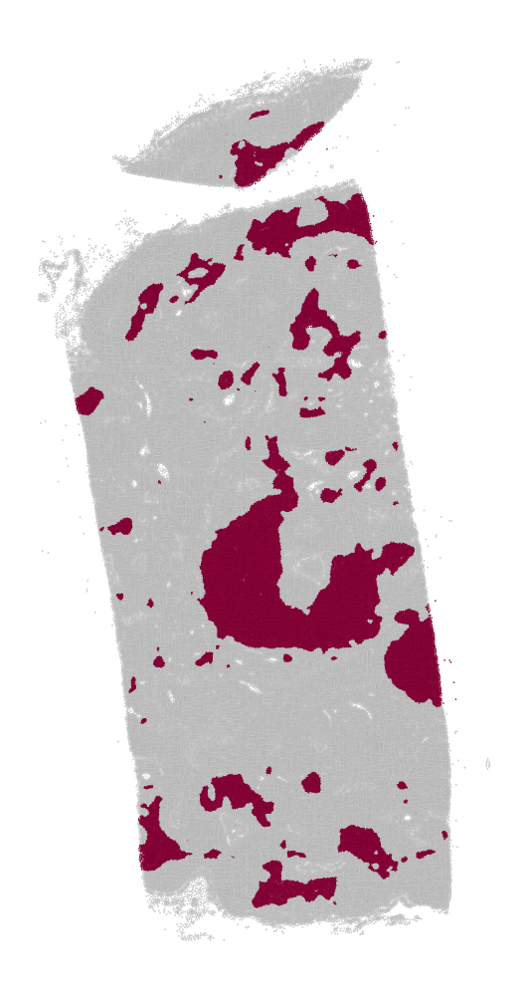

In [8]:
points = adata.obsm['spatial']
plt.figure(figsize=(4,8))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=0.5,
    c=adata.obs['paracortex_color'],
)
plt.axis('off')
filename = os.path.join(figpath, 'paracortex.png')
# plt.savefig(filename, dpi=300)
plt.show()

## Interactions

In [9]:
def embed(adata, region, n_comps, filter_key):

    adata_region = adata[adata.obs['region']==region]
    adata_notregion = adata[adata.obs['region']!=region]

    X = adata_region.layers[filter_key]
    X -= X.mean(axis=0)
    A = X.T @ X

    X_ = adata_notregion.layers[filter_key]
    X_ -= X_.mean(axis=0)
    B = X_.T @ X_

    w,V = eigh(A,B)
    w = w[::-1]
    V = V[:,::-1]

    V = V[:,:n_comps]
    adata.obsm[f'X_pca_{filter_key}'] = adata.layers[filter_key] @ V
    adata.varm[f'X_pca_{filter_key}'] = V
    adata.uns[f'comp_var_{filter_key}'] = w

    return V

### Paracortex

In [10]:
n_comps = 3
filter_key = 'highpass'
region = '1'

In [11]:
V = embed(adata, region, n_comps, filter_key)

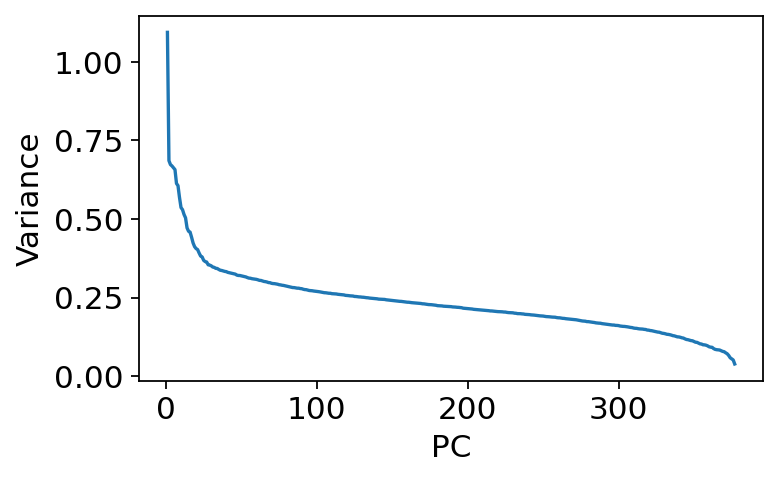

In [12]:
w = adata.uns[f'comp_var_{filter_key}']

plt.figure(figsize=(5,3))
plt.plot(np.arange(1,len(w)+1), w)
plt.xlabel('PC')
plt.ylabel('Variance')
plt.grid(None)
plt.show()

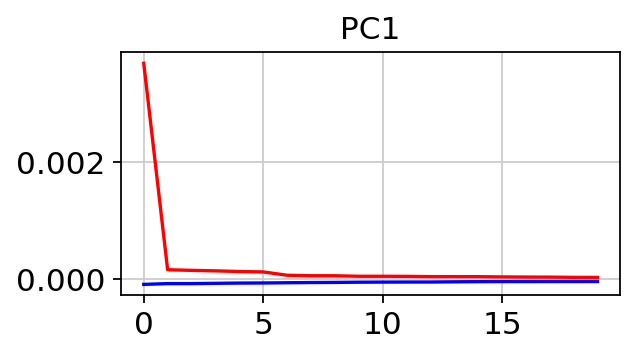

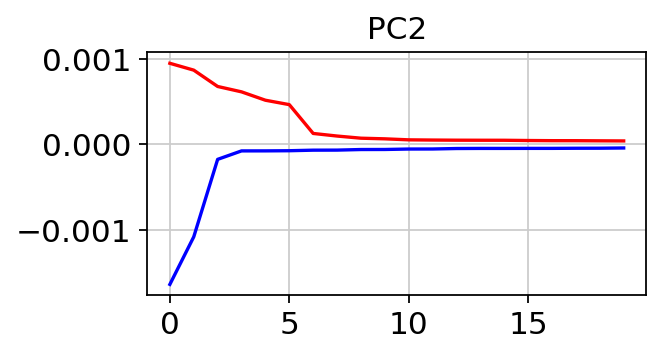

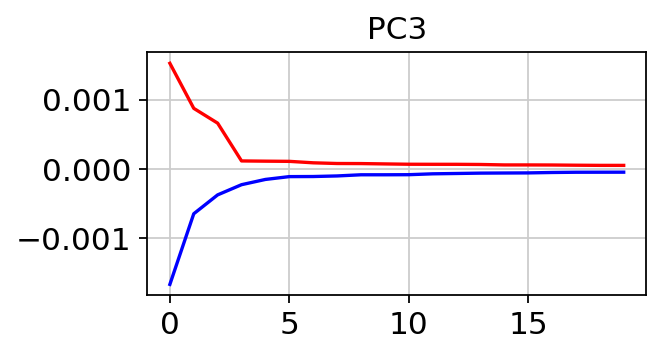

In [13]:
for i in range(n_comps):
    plt.figure(figsize=(4,2))
    plt.title(f'PC{i+1}')
    plt.plot(np.sort(adata.varm[f'X_pca_{filter_key}'][:,i])[::-1][:20], c='r')
    plt.plot(np.sort(adata.varm[f'X_pca_{filter_key}'][:,i])[:20], c='b')
    plt.show()

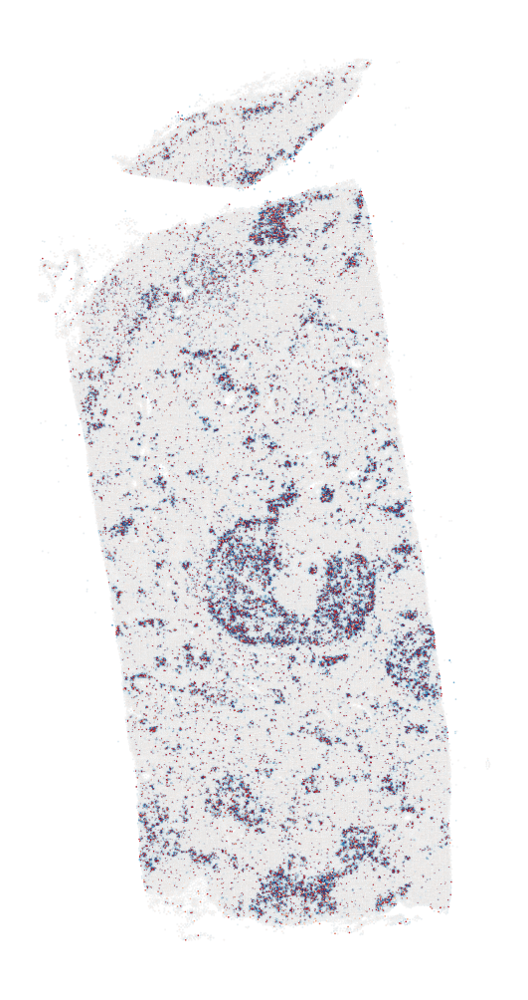

In [14]:
pc = 0
c = adata.obsm[f'X_pca_{filter_key}'][:,pc]
# norm = Normalize(vmin=-np.abs(c).max(), vmax=np.abs(c).max())
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
cmap = 'RdBu_r'

points = adata.obsm['spatial']
plt.figure(figsize=(4,8))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.005,
    s=0.5,
    c=c,
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'ixn_tzone.png')
# plt.savefig(filename, dpi=300)
plt.show()

In [15]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = height/8

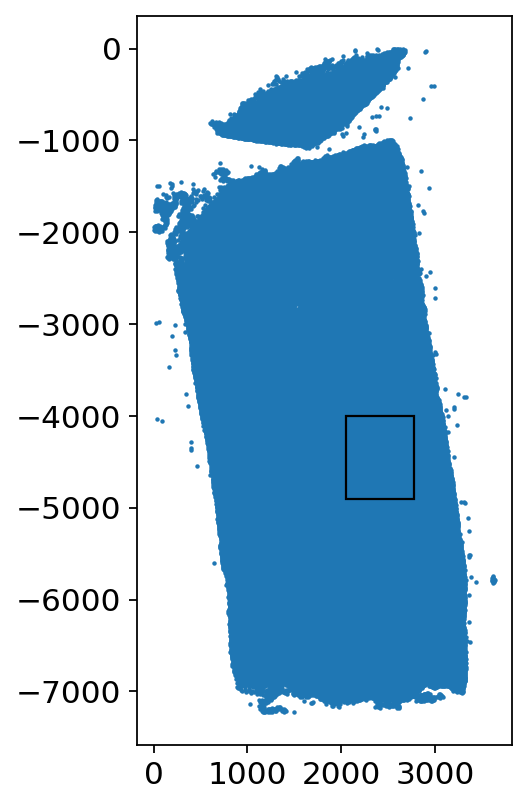

In [16]:
zoom_x = 2050
zoom_y = -4900

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=1)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k')
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [17]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [18]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 4
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))

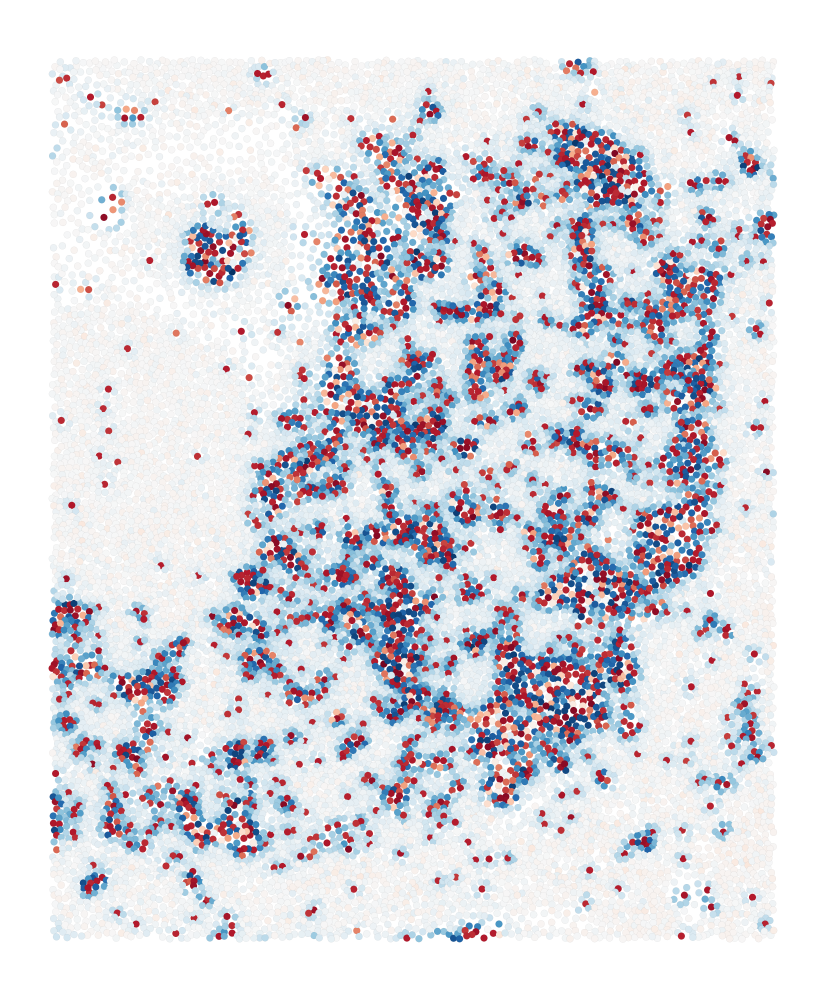

In [19]:
pc = 0
cmap = 'RdBu_r'
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    c=zdata.obsm[f'X_pca_{filter_key}'][:,pc],
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'ixn_tzone_zoom.png')
# plt.savefig(filename, dpi=300)
plt.show()

In [20]:
n_markers = 30
for i in range(n_comps):
    marker_idxs = np.argsort(adata.varm[f'X_pca_{filter_key}'][:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]

    print(f'========== PC{i+1} ==========')
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))

========== PC1 ==========
Positive markers:  ['LAMP3', 'CSF2RA', 'CCR7', 'CCL19', 'CD1E', 'FSTL3', 'TAT', 'TFF2', 'UPK3B', 'SPDEF', 'CD274', 'STC2', 'EHF', 'PRF1', 'AQP2', 'TMC5', 'CD83', 'BASP1', 'SOX2', 'MFAP5', 'KLRB1', 'FOXP3', 'DES', 'SLC22A8', 'TREM2', 'HES4', 'MDM2', 'PEBP4', 'FXYD2', 'BTNL9']
Negative markers:  ['AQP3', 'CD247', 'CD3D', 'HLA-DQB2', 'IL1R2', 'CD28', 'DNASE1L3', 'VCAN', 'CD3E', 'CLIC6', 'ADGRE1', 'SNCG', 'C20orf85', 'ANPEP', 'LY6D', 'C15orf48', 'S100A1', 'THY1', 'C6orf118', 'ACKR1', 'TBX3', 'GHRL', 'ASCL1', 'C1orf162', 'HMGCS2', 'CHGA', 'SNTN', 'TNFRSF9', 'MMRN2', 'CD70']
========== PC2 ==========
Positive markers:  ['CD8A', 'CD2', 'CD28', 'CTLA4', 'CCL19', 'FOXP3', 'KLRD1', 'KLRB1', 'CCL27', 'PRDM1', 'DUSP2', 'HES4', 'SERPINB2', 'DMBT1', 'TMEM174', 'KLRC1', 'IL7R', 'AGER', 'DPEP1', 'SELL', 'AQP8', 'KRT7', 'CD27', 'CCDC39', 'GPRC5A', 'TNFRSF9', 'CCR7', 'MLANA', 'OPRPN', 'ADGRE1']
Negative markers:  ['CD3D', 'CD247', 'LAMP3', 'SST', 'CHGA', 'TSPAN19', 'SERPINB3', 

## Subregions

In [9]:
def embed(adata, region, n_comps, filter_key):

    adata_region = adata[adata.obs['region']==region]
    adata_notregion = adata[adata.obs['region']!=region]

    X = adata_region.layers[filter_key]
    X -= X.mean(axis=0)
    A = X.T @ X

    X_ = adata_notregion.layers[filter_key]
    X_ -= X_.mean(axis=0)
    B = X_.T @ X_

    w,V = eigh(A,B)
    w = w[::-1]
    V = V[:,::-1]

    V = V[:,:n_comps]
    adata.obsm[f'X_pca_{filter_key}'] = adata.layers[filter_key] @ V
    adata.varm[f'X_pca_{filter_key}'] = V
    adata.uns[f'comp_var_{filter_key}'] = w

    return V

### Paracortex

In [10]:
n_comps = 3
# filter_key = 'reversehighpass'
filter_key = 'lowpass'
region = '1'

In [11]:
V = embed(adata, region, n_comps, filter_key)

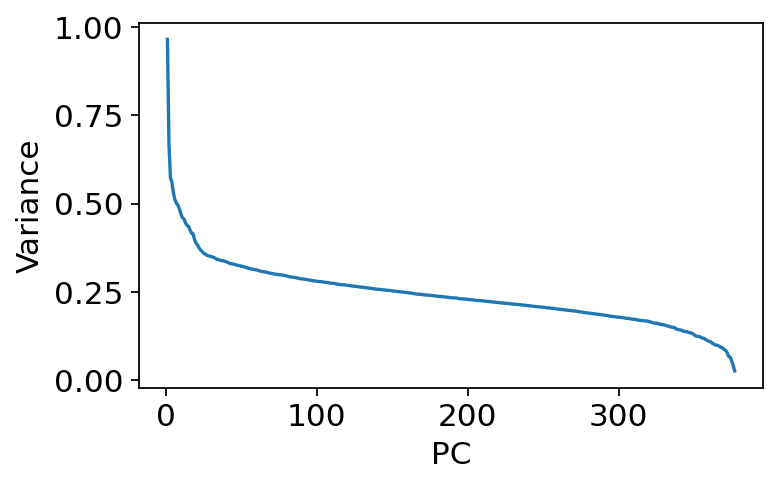

In [12]:
w = adata.uns[f'comp_var_{filter_key}']

plt.figure(figsize=(5,3))
plt.plot(np.arange(1,len(w)+1), w)
plt.xlabel('PC')
plt.ylabel('Variance')
plt.grid(None)
plt.show()

In [13]:
# for i in range(n_comps):
#     plt.figure(figsize=(4,2))
#     plt.title(f'PC{i+1}')
#     plt.plot(np.sort(adata.varm[f'X_pca_{filter_key}'][:,i])[::-1][:20], c='r')
#     plt.plot(np.sort(adata.varm[f'X_pca_{filter_key}'][:,i])[:20], c='b')
#     plt.show()

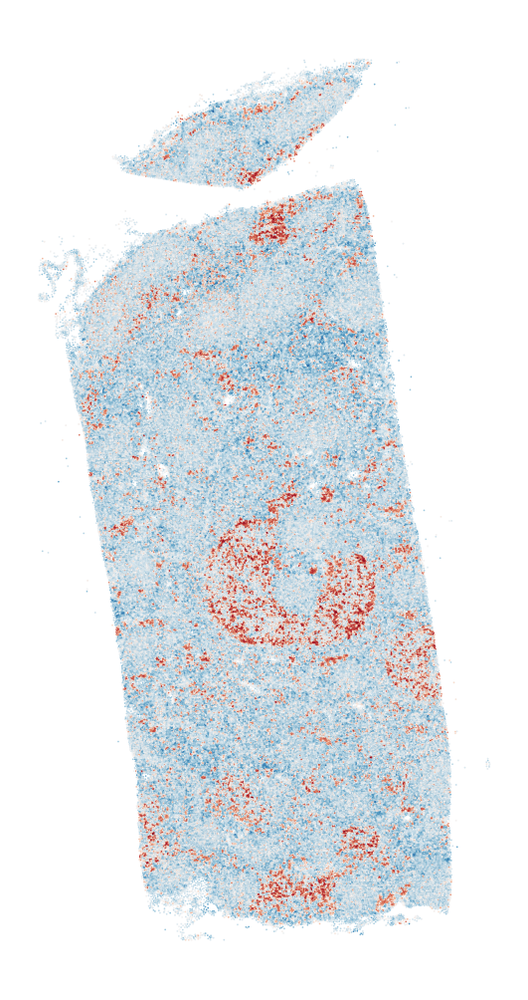

In [26]:
pc = 0
c = adata.obsm[f'X_pca_{filter_key}'][:,pc]
# norm = Normalize(vmin=-np.abs(c).max(), vmax=np.abs(c).max())
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
cmap = 'RdBu'

points = adata.obsm['spatial']
plt.figure(figsize=(4,8))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.005,
    s=0.5,
    c=c,
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'subregion_tzone.png')
plt.savefig(filename, dpi=300)
plt.show()

In [17]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = height/8

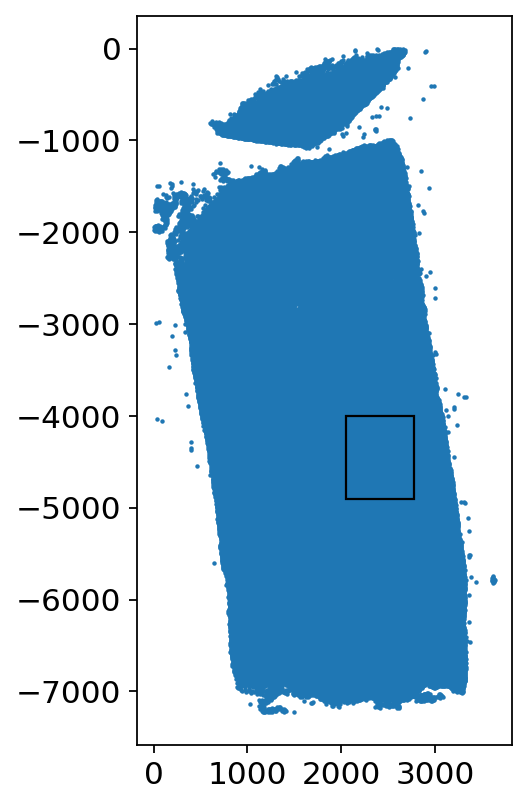

In [18]:
zoom_x = 2050
zoom_y = -4900

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=1)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k')
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [29]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

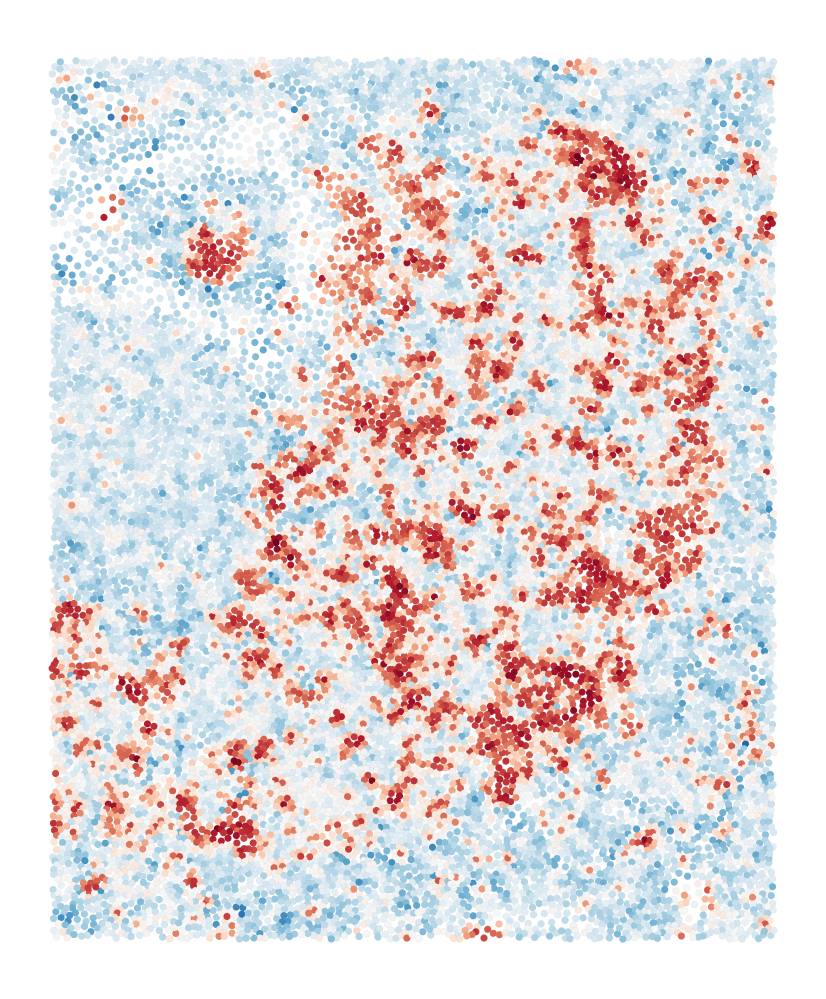

In [30]:
pc = 0
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    c=zdata.obsm[f'X_pca_{filter_key}'][:,pc],
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'subregion_tzone_zoom.png')
plt.savefig(filename, dpi=300)
plt.show()

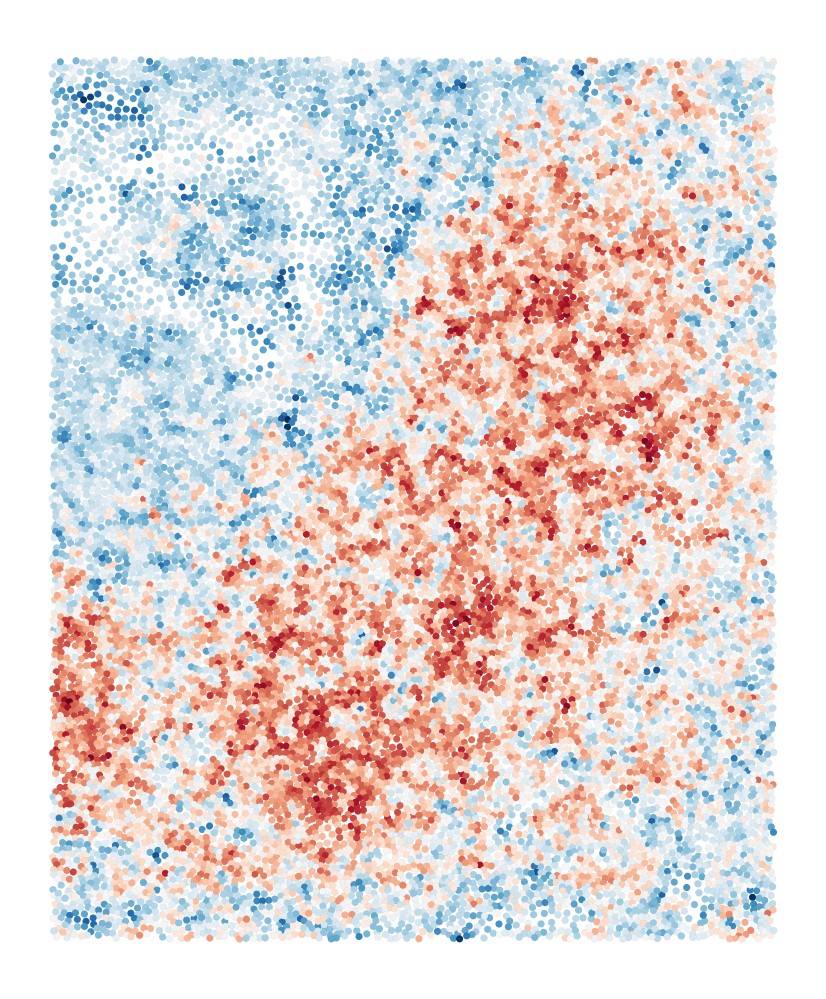

In [32]:
pc = 1
cmap = 'RdBu_r'
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    c=zdata.obsm[f'X_pca_{filter_key}'][:,pc],
    cmap=cmap,
    # norm=norm,
)
plt.axis('off')
plt.show()

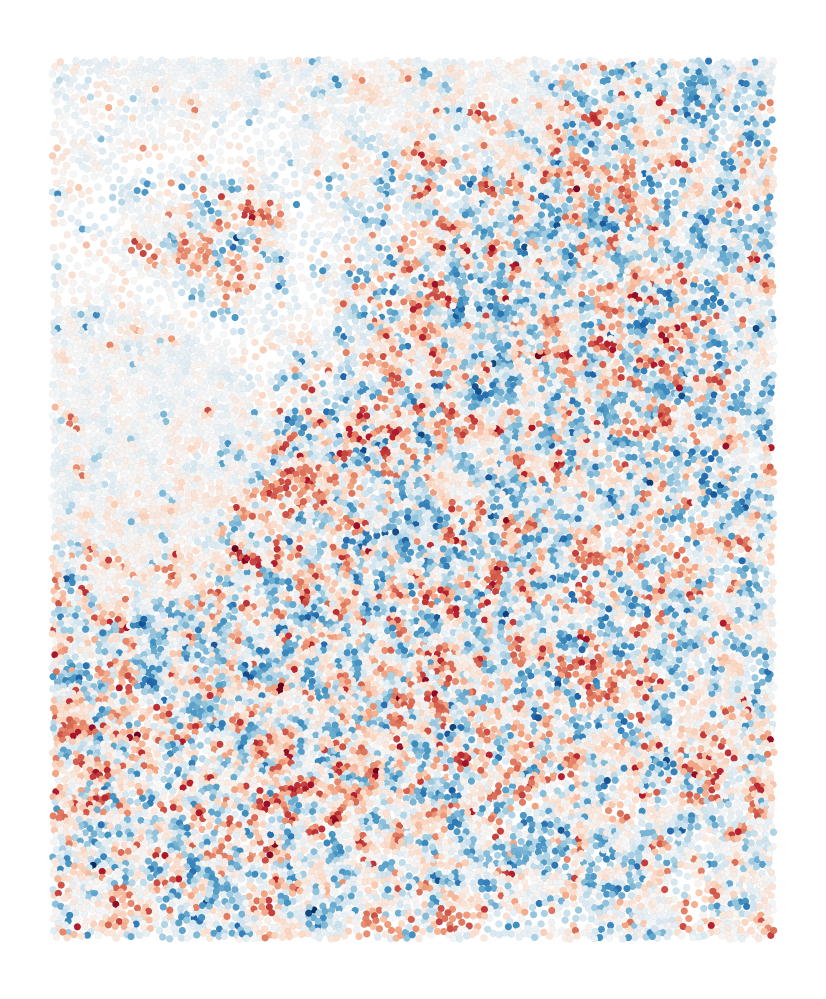

In [33]:
pc = 2
cmap = 'RdBu_r'
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    c=zdata.obsm[f'X_pca_{filter_key}'][:,pc],
    cmap=cmap,
    # norm=norm,
)
plt.axis('off')
plt.show()

In [31]:
n_markers = 10
for i in range(n_comps):
    marker_idxs = np.argsort(adata.varm[f'X_pca_{filter_key}'][:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]

    print(f'========== PC{i+1} ==========')
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))

========== PC1 ==========
Positive markers:  ['CXCL9', 'GNLY', 'DNASE1L3', 'CLEC10A', 'FGL2', 'THY1', 'TBX3', 'HLA-DQB2', 'CD8A', 'ACKR1']
Negative markers:  ['LAMP3', 'CSF2RA', 'CCL19', 'CD1E', 'CCR7', 'FSTL3', 'BASP1', 'CD83', 'CD274', 'RETN']
========== PC2 ==========
Positive markers:  ['CD3D', 'CD4', 'CD247', 'CD2', 'HEMGN', 'CXCR4', 'PTPRC', 'CCR7', 'DES', 'C1orf162']
Negative markers:  ['CTLA4', 'FOXP3', 'KLRB1', 'CXCL9', 'CD8A', 'MS4A1', 'GNLY', 'GZMK', 'IL7R', 'LAMP3']
========== PC3 ==========
Positive markers:  ['CCL19', 'DES', 'TRAC', 'CCR7', 'CCL5', 'EDNRB', 'NKG7', 'GZMK', 'CYP2B6', 'GZMA']
Negative markers:  ['CD8A', 'LAMP3', 'IL7R', 'AQP3', 'KLRB1', 'ACTA2', 'PECAM1', 'FHL2', 'ADAMTS1', 'CD274']


### Using adata

In [14]:
n_regions = 3
kmeans = KMeans(n_clusters=n_regions, random_state=1)
kmeans.fit(adata.obsm[f'X_pca_{filter_key}'])
adata.obs['region'] = kmeans.labels_.astype(str)

/stanley/WangLab/kamal/envs/xax/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [15]:
regions = sorted(adata.obs['region'].unique())
colors = np.array(sc.pl.palettes.default_28)[[0,5,9]]
palette = {region:color for region,color in zip(regions,colors)}

adata.obs['is_ixn'] = adata.obs['region'] == '2'
# adata.obs['is_ixn'] = adata.obs['region'] == '2'
paracortex_colormap = {True: [0.8, 0.2, 0.9], False: [0.8]*3}
# paracortex_colormap = {False: colors[1], True: [0.8]*3}
adata.obs['ixn_color'] = adata.obs['is_ixn'].map(paracortex_colormap)
# adata.obs['ixn_color'] = adata.obs['region'].map(palette)

In [19]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [21]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 4
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))

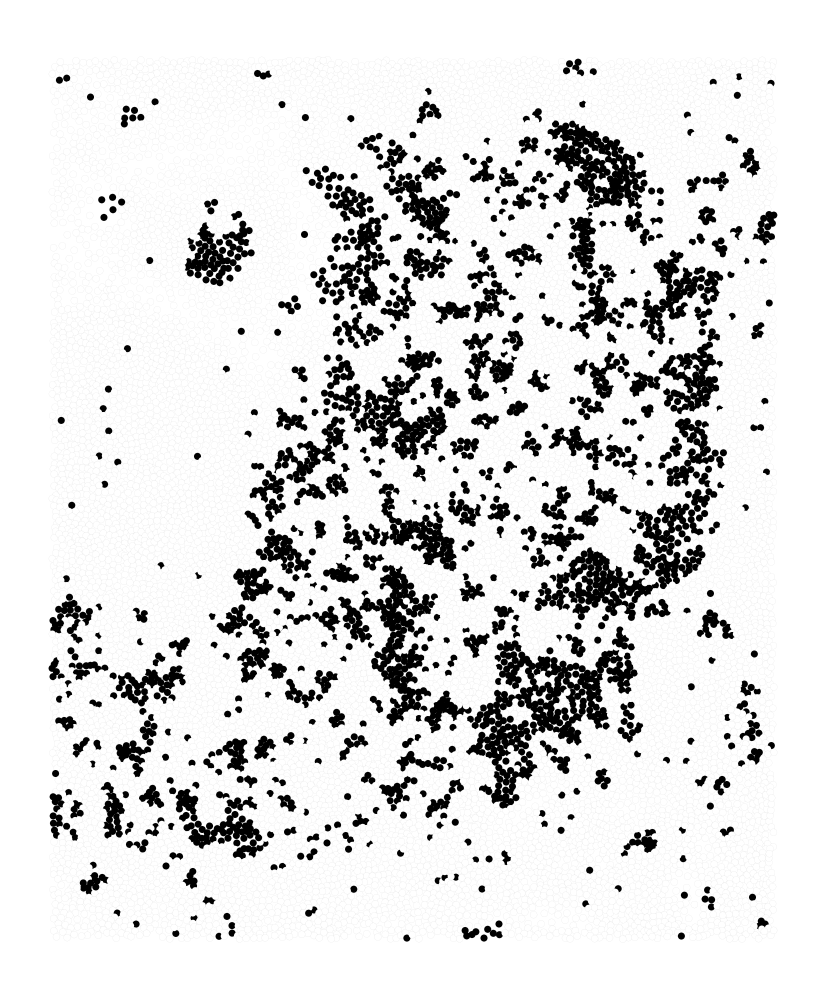

In [35]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    # c=zdata.obs['ixn_color'],
    c=zdata.obs['is_ixn'],
    # cmap='Purples'
    cmap='Greys'
)
plt.axis('off')
filename = os.path.join(figpath, f'subregion_paracortex_zoom.png')
plt.savefig(filename, dpi=300)
plt.show()

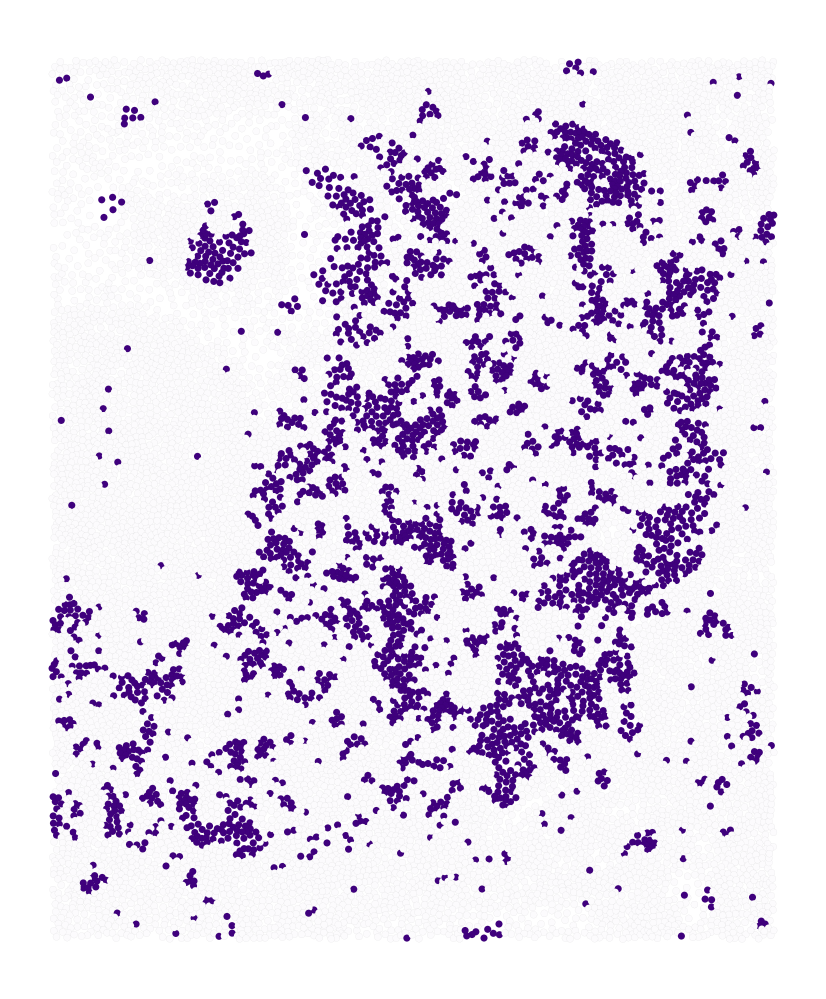

In [22]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    # c=zdata.obs['ixn_color'],
    c=zdata.obs['is_ixn'],
    cmap='Purples'
    # cmap='Greys'
)
plt.axis('off')
filename = os.path.join(figpath, f'subregion_paracortex_zoom_purple.png')
plt.savefig(filename, dpi=300)
plt.show()

In [37]:
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, groupby='region')#, layer='revlappass')
sc.tl.dendrogram(adata, groupby='region', use_rep=f'X_pca_{filter_key}')

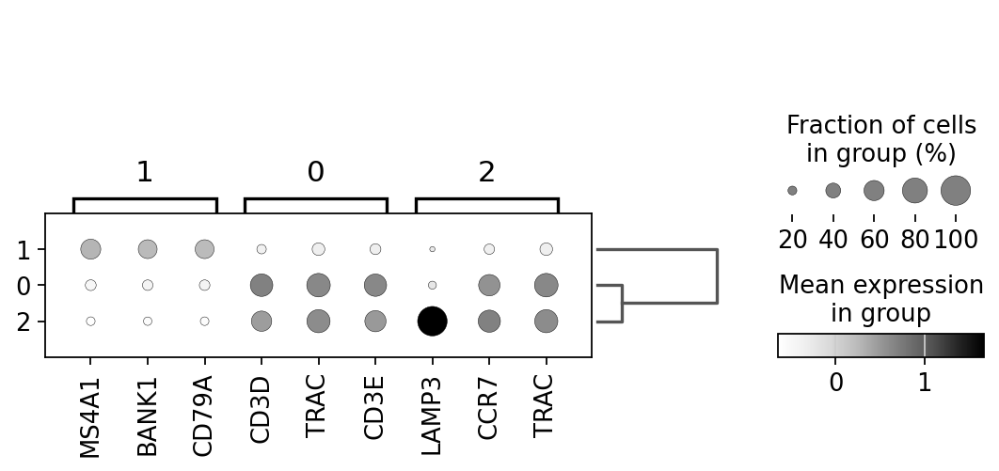

In [38]:
fig = plt.figure(figsize=(8,3))
ax = plt.gca()
sc.pl.rank_genes_groups_dotplot(adata, groupby='region', n_genes=3, ax=ax, cmap='Greys', layer=filter_key)
figname = 'subregion_markers.png'
savepath = os.path.join(figpath, figname)
fig.savefig(savepath, dpi=dpi, bbox_inches='tight')

# Plot high and low-pass kernels

In [3]:
lmax = 1.5
increment = 0.05
freqs = np.arange(0,lmax+increment,increment)

## Linear

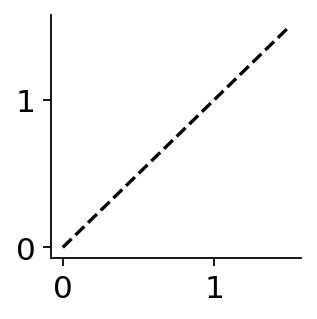

In [45]:
plt.figure(figsize=(2,2))
plt.plot(freqs, freqs, color='k', linestyle='--')
plt.gca().spines[['top','right']].set_visible(False)
plt.grid()
figname = f'lappass_filter.png'
savepath = os.path.join(figpath, figname)
plt.savefig(savepath, dpi=dpi)
plt.show()

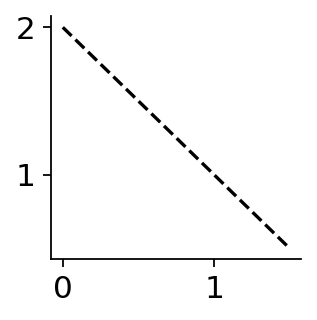

In [46]:
plt.figure(figsize=(2,2))
plt.plot(freqs, 2 - freqs, color='k', linestyle='--')
plt.gca().spines[['top','right']].set_visible(False)
plt.grid()
figname = f'revlappass_filter.png'
savepath = os.path.join(figpath, figname)
plt.savefig(savepath, dpi=dpi)
plt.show()

## Square root

In [11]:
fontsize = 12

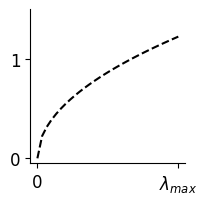

In [12]:
plt.figure(figsize=(2,2))
plt.plot(freqs, np.sqrt(freqs), color='k', linestyle='--')
plt.gca().spines[['top','right']].set_visible(False)
plt.grid(False)
plt.xticks([0,lmax],[0,r'$\lambda_{max}$'], fontsize=fontsize)
plt.yticks([0,1],[0,1], fontsize=fontsize)
plt.ylim(-0.05, 1.5)
figname = f'sqrtlappass_filter.png'
savepath = os.path.join(figpath, figname)
# plt.savefig(savepath, dpi=dpi)
plt.savefig(savepath, dpi=dpi, bbox_inches='tight')
plt.show()

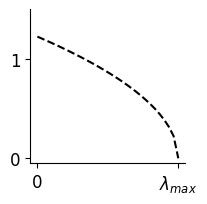

In [13]:
plt.figure(figsize=(2,2))
plt.plot(freqs, np.sqrt(lmax-freqs), color='k', linestyle='--')
plt.gca().spines[['top','right']].set_visible(False)
plt.grid(False)
plt.xticks([0,lmax],[0,r'$\lambda_{max}$'], fontsize=fontsize)
plt.yticks([0,1],[0,1], fontsize=fontsize)
plt.ylim(-0.05, 1.5)
figname = f'revsqrtlappass_filter.png'
savepath = os.path.join(figpath, figname)
# plt.savefig(savepath, dpi=dpi)
plt.savefig(savepath, dpi=dpi, bbox_inches='tight')
plt.show()